In [2]:
import mlflow
# Step 2: Set up the MLflow tracking server
mlflow.set_tracking_uri("http://127.0.0.1:5000")

In [3]:
# Set or create an experiment
mlflow.set_experiment("LightGBM HP Tuning")

2025/12/15 17:24:28 INFO mlflow.tracking.fluent: Experiment with name 'LightGBM HP Tuning' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/804671475800427085', creation_time=1765815868580, experiment_id='804671475800427085', last_update_time=1765815868580, lifecycle_stage='active', name='LightGBM HP Tuning', tags={}>

In [4]:
import pandas as pd

df = pd.read_csv('reddit_preprocessing.csv').dropna()
df.shape

(36662, 2)

In [5]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
import mlflow
import mlflow.sklearn
import optuna
from lightgbm import LGBMClassifier
import matplotlib.pyplot as plt

In [6]:
# Step 3: TF-IDF vectorizer setup
ngram_range = (1, 3)  # Trigram
max_features = 1000  # Set max_features to 1000
vectorizer = TfidfVectorizer(ngram_range=ngram_range, max_features=max_features)
X = vectorizer.fit_transform(df['clean_comment'])
y = df['category']

# Step 4: Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

d:\Ananc\envs\conda\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


In [7]:
# Step 5: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

In [8]:
# Function to log results in MLflow
def log_mlflow(model_name, model, X_train, X_test, y_train, y_test, params, trial_number):
    with mlflow.start_run():
        # Log model type and trial number
        mlflow.set_tag("mlflow.runName", f"Trial_{trial_number}_{model_name}_SMOTE_TFIDF_Trigrams")
        mlflow.set_tag("experiment_type", "algorithm_comparison")

        # Log algorithm name as a parameter
        mlflow.log_param("algo_name", model_name)

        # Log hyperparameters
        for key, value in params.items():
            mlflow.log_param(key, value)

        # Train model
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Log accuracy
        accuracy = accuracy_score(y_test, y_pred)
        mlflow.log_metric("accuracy", accuracy)

        # Log classification report
        classification_rep = classification_report(y_test, y_pred, output_dict=True)
        for label, metrics in classification_rep.items():
            if isinstance(metrics, dict):
                for metric, value in metrics.items():
                    mlflow.log_metric(f"{label}_{metric}", value)

        # Log the model
        mlflow.sklearn.log_model(model, f"{model_name}_model")

        return accuracy




In [9]:
# Step 6: Optuna objective function for LightGBM
def objective_lightgbm(trial):
    # Hyperparameter space to explore
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-1, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    num_leaves = trial.suggest_int('num_leaves', 20, 150)
    min_child_samples = trial.suggest_int('min_child_samples', 10, 100)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-4, 10.0, log=True)  # L1 regularization
    reg_lambda = trial.suggest_float('reg_lambda', 1e-4, 10.0, log=True)  # L2 regularization

    # Log trial parameters
    params = {
        'n_estimators': n_estimators,
        'learning_rate': learning_rate,
        'max_depth': max_depth,
        'num_leaves': num_leaves,
        'min_child_samples': min_child_samples,
        'colsample_bytree': colsample_bytree,
        'subsample': subsample,
        'reg_alpha': reg_alpha,
        'reg_lambda': reg_lambda
    }

    # Create LightGBM model
    model = LGBMClassifier(n_estimators=n_estimators,
                           learning_rate=learning_rate,
                           max_depth=max_depth,
                           num_leaves=num_leaves,
                           min_child_samples=min_child_samples,
                           colsample_bytree=colsample_bytree,
                           subsample=subsample,
                           reg_alpha=reg_alpha,
                           reg_lambda=reg_lambda,
                           random_state=42)

    # Log each trial as a separate run in MLflow
    accuracy = log_mlflow("LightGBM", model, X_train, X_test, y_train, y_test, params, trial.number)

    return accuracy




In [18]:
from optuna.visualization import matplotlib as optuna_matplotlib




# Step 7: Run Optuna for LightGBM, log the best model, and plot the importance of each parameter
def run_optuna_experiment():
    study = optuna.create_study(direction="maximize")
    study.optimize(objective_lightgbm, n_trials=100)  # Increased to 100 trials

    # Get the best parameters
    best_params = study.best_params
    best_model = LGBMClassifier(n_estimators=best_params['n_estimators'],
                                learning_rate=best_params['learning_rate'],
                                max_depth=best_params['max_depth'],
                                num_leaves=best_params['num_leaves'],
                                min_child_samples=best_params['min_child_samples'],
                                colsample_bytree=best_params['colsample_bytree'],
                                subsample=best_params['subsample'],
                                reg_alpha=best_params['reg_alpha'],
                                reg_lambda=best_params['reg_lambda'],
                                random_state=42)

    # Log the best model with MLflow and print the classification report
    log_mlflow("LightGBM", best_model, X_train, X_test, y_train, y_test, best_params, "Best")

    # Plot parameter importance
    optuna_matplotlib.plot_param_importances(study)

    # Plot optimization history
    optuna_matplotlib.plot_optimization_history(study)

    plt.show()


[I 2025-12-15 20:32:18,762] A new study created in memory with name: no-name-18b29cd0-45f7-4575-a67b-b0c889decee3


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052866 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 98794
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 949
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:32:33 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:32:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:32:37,231] Trial 0 finished with value: 0.787994081589516 and parameters: {'n_estimators': 600, 'learning_rate': 0.023034913457475988, 'max_depth': 8, 'num_leaves': 140, 'min_child_samples': 93, 'colsample_bytree': 0.8460901255591706, 'subsample': 0.7320801685573766, 'reg_alpha': 0.02318495222632355, 'reg_lambda': 0.0028362673908199068}. Best is trial 0 with value: 0.787994081589516.


🏃 View run Trial_0_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d1ba4515c7ae4200b102726fae6c8e73
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053025 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 98794
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 949
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:32:48 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:32:51 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:32:51,958] Trial 1 finished with value: 0.5981822024941873 and parameters: {'n_estimators': 544, 'learning_rate': 0.0004245771925175538, 'max_depth': 5, 'num_leaves': 97, 'min_child_samples': 93, 'colsample_bytree': 0.7695086574956675, 'subsample': 0.6231351749954318, 'reg_alpha': 0.1684463265392485, 'reg_lambda': 0.0003630167056196361}. Best is trial 0 with value: 0.787994081589516.


🏃 View run Trial_1_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/7b747053a82a4d208b2b1a7a21c6f2fb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059082 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 98794
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 949
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:33:02 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:33:05 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:33:06,075] Trial 2 finished with value: 0.7969773832170789 and parameters: {'n_estimators': 259, 'learning_rate': 0.050163919271463055, 'max_depth': 14, 'num_leaves': 137, 'min_child_samples': 93, 'colsample_bytree': 0.9795960337713647, 'subsample': 0.9597168005908581, 'reg_alpha': 0.13633217680641185, 'reg_lambda': 0.1145735658344191}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_2_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/6794e4912a134400aeb8b660059d3e5f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063223 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 98980
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 955
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:33:12 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:33:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:33:15,283] Trial 3 finished with value: 0.6693088142041852 and parameters: {'n_estimators': 134, 'learning_rate': 0.006547979284591321, 'max_depth': 10, 'num_leaves': 146, 'min_child_samples': 86, 'colsample_bytree': 0.834313588437811, 'subsample': 0.8658813336115782, 'reg_alpha': 1.3395301696085433, 'reg_lambda': 0.0012243615744650964}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_3_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/4d461f113532400780ee92d98844aa8d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052571 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99297
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:33:24 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:33:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:33:27,299] Trial 4 finished with value: 0.7720355104629042 and parameters: {'n_estimators': 520, 'learning_rate': 0.03173506285697871, 'max_depth': 4, 'num_leaves': 98, 'min_child_samples': 21, 'colsample_bytree': 0.6069594672825468, 'subsample': 0.8519953025710777, 'reg_alpha': 0.00014169527600707958, 'reg_lambda': 0.8534543039484271}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_4_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/ce02d1f7f6004a6e88f5283a2cbf1c8b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044434 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99103
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 960
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:33:43 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:33:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:33:46,648] Trial 5 finished with value: 0.717290213485521 and parameters: {'n_estimators': 375, 'learning_rate': 0.0019827851785433263, 'max_depth': 14, 'num_leaves': 80, 'min_child_samples': 63, 'colsample_bytree': 0.558990435903295, 'subsample': 0.9331006216235944, 'reg_alpha': 1.8992170104464732, 'reg_lambda': 0.8759400218347329}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_5_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/4dcf3082b33143e88a2777ac816dca78
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:33:55 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:33:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:33:58,300] Trial 6 finished with value: 0.6453181145635172 and parameters: {'n_estimators': 255, 'learning_rate': 0.0009268602165726394, 'max_depth': 9, 'num_leaves': 73, 'min_child_samples': 44, 'colsample_bytree': 0.8191704899249852, 'subsample': 0.7641188072938162, 'reg_alpha': 6.485262642006253, 'reg_lambda': 0.02041617678147141}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_6_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/79d5ac605e6b41fdaec87abb38a5deba
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042408 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:34:32 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:34:35 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:34:35,436] Trial 7 finished with value: 0.6831536673007821 and parameters: {'n_estimators': 919, 'learning_rate': 0.00111648643665613, 'max_depth': 9, 'num_leaves': 36, 'min_child_samples': 48, 'colsample_bytree': 0.5847298788484087, 'subsample': 0.9583369200105808, 'reg_alpha': 0.0024057839977211786, 'reg_lambda': 0.0010860548340958637}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_7_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/6c6edb18181e42c1aa53a872c48e22eb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062707 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99058
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 958
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:34:47 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:34:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:34:50,549] Trial 8 finished with value: 0.6400338194884803 and parameters: {'n_estimators': 314, 'learning_rate': 0.0023011430521524875, 'max_depth': 7, 'num_leaves': 108, 'min_child_samples': 69, 'colsample_bytree': 0.8322881004109466, 'subsample': 0.7483988823779081, 'reg_alpha': 0.0131703810093023, 'reg_lambda': 0.00034925888421225536}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_8_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/35864f8bbcb24847a0cb0091cd5d4e8a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 98950
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 954
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:34:54 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:34:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:34:57,206] Trial 9 finished with value: 0.6605368843796238 and parameters: {'n_estimators': 101, 'learning_rate': 0.0012782062722636765, 'max_depth': 9, 'num_leaves': 23, 'min_child_samples': 88, 'colsample_bytree': 0.6742276469940465, 'subsample': 0.5468132295134114, 'reg_alpha': 4.20611041102221, 'reg_lambda': 0.2329969557881477}. Best is trial 2 with value: 0.7969773832170789.


🏃 View run Trial_9_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/ff06c06a03124adc90746703c29587cc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055249 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99330
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:35:31 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:35:34 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:35:34,373] Trial 10 finished with value: 0.8169520186007186 and parameters: {'n_estimators': 777, 'learning_rate': 0.08434066027853879, 'max_depth': 14, 'num_leaves': 128, 'min_child_samples': 17, 'colsample_bytree': 0.988889556278559, 'subsample': 0.9932667445386935, 'reg_alpha': 0.23436116616674754, 'reg_lambda': 5.841158476171529}. Best is trial 10 with value: 0.8169520186007186.


🏃 View run Trial_10_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/6f4c96fe524243ff911b41144cb12087
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:36:16 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:36:19 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:36:19,880] Trial 11 finished with value: 0.8185373071232298 and parameters: {'n_estimators': 816, 'learning_rate': 0.07694391286694996, 'max_depth': 15, 'num_leaves': 124, 'min_child_samples': 10, 'colsample_bytree': 0.9885697652979, 'subsample': 0.9955260384697926, 'reg_alpha': 0.21668454358248213, 'reg_lambda': 7.788833824798455}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_11_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/60f201802b4c4390ae946515333ad9cb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.065133 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:36:51 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:36:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:36:54,381] Trial 12 finished with value: 0.8173747622067217 and parameters: {'n_estimators': 862, 'learning_rate': 0.0931004272836341, 'max_depth': 12, 'num_leaves': 122, 'min_child_samples': 18, 'colsample_bytree': 0.9822094181968999, 'subsample': 0.9853958019108954, 'reg_alpha': 0.24987013650945716, 'reg_lambda': 7.508916169749809}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_12_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/336d91befe28462f8370b2d8b22b0268
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:37:49 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:37:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:37:53,255] Trial 13 finished with value: 0.787994081589516 and parameters: {'n_estimators': 976, 'learning_rate': 0.009476385406730833, 'max_depth': 12, 'num_leaves': 116, 'min_child_samples': 10, 'colsample_bytree': 0.94462945407077, 'subsample': 0.8777460078999992, 'reg_alpha': 0.4769044444154115, 'reg_lambda': 6.778658236842144}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_13_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/6e47608d79d542759c17d40c29f41743
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.042178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99236
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:38:27 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:38:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:38:30,477] Trial 14 finished with value: 0.8015218769816107 and parameters: {'n_estimators': 791, 'learning_rate': 0.018217929225292848, 'max_depth': 12, 'num_leaves': 120, 'min_child_samples': 31, 'colsample_bytree': 0.9167658312836358, 'subsample': 0.8065885929491424, 'reg_alpha': 0.003852112894525476, 'reg_lambda': 1.8243879384384696}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_14_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/0712f704ece3401fb8020d68ecd7ab2d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:38:57 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:39:00 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:39:00,648] Trial 15 finished with value: 0.8136757556541957 and parameters: {'n_estimators': 796, 'learning_rate': 0.09256173273605581, 'max_depth': 12, 'num_leaves': 59, 'min_child_samples': 34, 'colsample_bytree': 0.9001559073304267, 'subsample': 0.9139980606375565, 'reg_alpha': 0.06262170435239967, 'reg_lambda': 0.021211632216378527}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_15_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/9a0487204d5743dab76af3de4f8d176f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060105 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99245
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:39:46 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:39:49 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:39:49,983] Trial 16 finished with value: 0.7019657577679138 and parameters: {'n_estimators': 692, 'learning_rate': 0.0001122128061391854, 'max_depth': 15, 'num_leaves': 100, 'min_child_samples': 28, 'colsample_bytree': 0.7048768955276699, 'subsample': 0.9954332366981011, 'reg_alpha': 0.6833293165713444, 'reg_lambda': 0.16007913487988062}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_16_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/52588364f60b40908d95d3832d4efa57
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99352
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 983
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:40:39 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:40:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:40:42,673] Trial 17 finished with value: 0.7684421898118791 and parameters: {'n_estimators': 912, 'learning_rate': 0.006708112567914533, 'max_depth': 11, 'num_leaves': 125, 'min_child_samples': 11, 'colsample_bytree': 0.9070898847365492, 'subsample': 0.6397084877787427, 'reg_alpha': 0.00694251664893791, 'reg_lambda': 9.93516573965015}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_17_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/fb5165ade87e46119ef8d91edb245b04
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99255
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 969
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:41:10 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:41:13 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:41:13,432] Trial 18 finished with value: 0.8154724159797083 and parameters: {'n_estimators': 663, 'learning_rate': 0.04761625679570105, 'max_depth': 15, 'num_leaves': 56, 'min_child_samples': 25, 'colsample_bytree': 0.5082968287200705, 'subsample': 0.8206545586988168, 'reg_alpha': 0.0008694227897824998, 'reg_lambda': 1.4727984466944208}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_18_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/090a57828b494a538bc774722fdb5ccd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.056514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:41:51 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:41:54 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:41:54,397] Trial 19 finished with value: 0.7994081589515959 and parameters: {'n_estimators': 839, 'learning_rate': 0.014922358290935562, 'max_depth': 13, 'num_leaves': 149, 'min_child_samples': 37, 'colsample_bytree': 0.9862068397516834, 'subsample': 0.9084840007169116, 'reg_alpha': 0.060242923291688955, 'reg_lambda': 2.758518769929241}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_19_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/57452d13aaee48c8ba0738631a4c7c4b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99206
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:42:29 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:42:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:42:32,418] Trial 20 finished with value: 0.7327203551046291 and parameters: {'n_estimators': 695, 'learning_rate': 0.003981654035134251, 'max_depth': 11, 'num_leaves': 90, 'min_child_samples': 58, 'colsample_bytree': 0.7593110741853606, 'subsample': 0.6920144558613274, 'reg_alpha': 0.0488568322567109, 'reg_lambda': 0.3614911169453029}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_20_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/03a46a690c0742868e6e7347dd8a9c29
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049524 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99330
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:43:08 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:43:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:43:11,627] Trial 21 finished with value: 0.8154724159797083 and parameters: {'n_estimators': 838, 'learning_rate': 0.08859689049284236, 'max_depth': 14, 'num_leaves': 128, 'min_child_samples': 17, 'colsample_bytree': 0.9941743506841915, 'subsample': 0.9960871329921894, 'reg_alpha': 0.28846696815671125, 'reg_lambda': 4.836094531629412}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_21_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/e58b8289096d4bc5b20016f3d5ac591d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051520 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99330
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:43:42 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:43:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:43:45,688] Trial 22 finished with value: 0.8145212428662016 and parameters: {'n_estimators': 736, 'learning_rate': 0.06374862000330185, 'max_depth': 13, 'num_leaves': 133, 'min_child_samples': 17, 'colsample_bytree': 0.9492192194960047, 'subsample': 0.9996811166547085, 'reg_alpha': 0.9695814571337795, 'reg_lambda': 3.581141128691481}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_22_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/7ca41b72cc6c48bab1aaa6d43662963d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050952 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:44:35 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:44:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:44:39,049] Trial 23 finished with value: 0.8161065313887127 and parameters: {'n_estimators': 922, 'learning_rate': 0.03181415477441591, 'max_depth': 15, 'num_leaves': 111, 'min_child_samples': 10, 'colsample_bytree': 0.8712897698403388, 'subsample': 0.9497386819216744, 'reg_alpha': 0.14935172161480076, 'reg_lambda': 9.717906136049951}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_23_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/2f037ee602964856ae7984829e612e43
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:45:12 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:45:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:45:15,639] Trial 24 finished with value: 0.8125132107376876 and parameters: {'n_estimators': 995, 'learning_rate': 0.09989474895883443, 'max_depth': 13, 'num_leaves': 122, 'min_child_samples': 41, 'colsample_bytree': 0.9529754719340919, 'subsample': 0.9074756844630054, 'reg_alpha': 2.937503894089989, 'reg_lambda': 0.629874984706592}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_24_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/e29c88863b1946c0b6a01ec36f600f57
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055883 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:45:45 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:45:48 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:45:48,491] Trial 25 finished with value: 0.8133586979496935 and parameters: {'n_estimators': 608, 'learning_rate': 0.03834258495238741, 'max_depth': 14, 'num_leaves': 110, 'min_child_samples': 22, 'colsample_bytree': 0.8780662683922453, 'subsample': 0.9587775408403798, 'reg_alpha': 0.33390701615933827, 'reg_lambda': 0.06362143963123118}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_25_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/5467e78a49a14e21beca362f275f39e1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.047511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99330
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:46:12 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:46:16 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:46:16,225] Trial 26 finished with value: 0.774149228492919 and parameters: {'n_estimators': 463, 'learning_rate': 0.013754984365194399, 'max_depth': 11, 'num_leaves': 133, 'min_child_samples': 17, 'colsample_bytree': 0.9985209950145487, 'subsample': 0.8217931885100921, 'reg_alpha': 0.10471476706087553, 'reg_lambda': 2.657860926376241}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_26_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/da2bbbcc64084e438c3468a211894fee
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99009
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 956
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:46:44 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:46:47 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:46:47,802] Trial 27 finished with value: 0.8061720566476432 and parameters: {'n_estimators': 770, 'learning_rate': 0.06528338774679257, 'max_depth': 15, 'num_leaves': 141, 'min_child_samples': 78, 'colsample_bytree': 0.9322254041124747, 'subsample': 0.8930186079951453, 'reg_alpha': 0.027078533562037696, 'reg_lambda': 0.4771363547356013}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_27_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/a3ee1fca66b245e095016981851259f1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:47:18 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:47:21 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:47:21,786] Trial 28 finished with value: 0.8081800887761572 and parameters: {'n_estimators': 868, 'learning_rate': 0.025839837882548764, 'max_depth': 13, 'num_leaves': 103, 'min_child_samples': 48, 'colsample_bytree': 0.8027066590011016, 'subsample': 0.9755040201650733, 'reg_alpha': 0.46260661411627874, 'reg_lambda': 1.52053964946317}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_28_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/5681e24f9e3b47a09a2e1c2b52d4ce94
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99236
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:47:36 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:47:39 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:47:39,754] Trial 29 finished with value: 0.7739378566899175 and parameters: {'n_estimators': 618, 'learning_rate': 0.02200256958368626, 'max_depth': 7, 'num_leaves': 86, 'min_child_samples': 29, 'colsample_bytree': 0.8668589749239675, 'subsample': 0.9303683193164911, 'reg_alpha': 8.909219469849862, 'reg_lambda': 0.006549838395171682}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_29_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/97c60de3a4a1462dab4efc720bbf72ba
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99330
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:48:08 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:48:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:48:12,068] Trial 30 finished with value: 0.815578101881209 and parameters: {'n_estimators': 720, 'learning_rate': 0.05593742568554203, 'max_depth': 12, 'num_leaves': 116, 'min_child_samples': 17, 'colsample_bytree': 0.9622436605552851, 'subsample': 0.779347700169915, 'reg_alpha': 0.017869466282505245, 'reg_lambda': 4.966294194810586}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_30_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/858fc66bd4e34136b3defa5326317ba0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.101659 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:51:02 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:51:05 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:51:05,767] Trial 31 finished with value: 0.818008877615726 and parameters: {'n_estimators': 916, 'learning_rate': 0.03418842985176164, 'max_depth': 15, 'num_leaves': 113, 'min_child_samples': 10, 'colsample_bytree': 0.8764409142681726, 'subsample': 0.95604671010985, 'reg_alpha': 0.20024571431871208, 'reg_lambda': 9.659873446401983}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_31_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/fdd41bade6d64ef59252462036483374
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057348 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:51:41 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:51:44 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:51:45,102] Trial 32 finished with value: 0.8132530120481928 and parameters: {'n_estimators': 867, 'learning_rate': 0.03827699951902479, 'max_depth': 14, 'num_leaves': 132, 'min_child_samples': 23, 'colsample_bytree': 0.9150418531614883, 'subsample': 0.9783684025583144, 'reg_alpha': 0.2269445743155725, 'reg_lambda': 4.33163277098202}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_32_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/6c43357dbd074a32b0272930cf7ba4cd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048852 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:52:31 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:52:35 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:52:35,414] Trial 33 finished with value: 0.8116677235256817 and parameters: {'n_estimators': 957, 'learning_rate': 0.06636869768529373, 'max_depth': 15, 'num_leaves': 141, 'min_child_samples': 14, 'colsample_bytree': 0.9708016649027751, 'subsample': 0.9411152286341514, 'reg_alpha': 0.09610048779789838, 'reg_lambda': 1.3826523417028334}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_33_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/f8b33b7296a14b099c0c05526d2588ea
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052290 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99255
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 969
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:53:04 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:53:07 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:53:07,408] Trial 34 finished with value: 0.8174804481082224 and parameters: {'n_estimators': 803, 'learning_rate': 0.0988157288210737, 'max_depth': 14, 'num_leaves': 124, 'min_child_samples': 27, 'colsample_bytree': 0.7909552929588533, 'subsample': 0.7135499328402962, 'reg_alpha': 1.0004694334559565, 'reg_lambda': 9.6320259047288}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_34_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/2a88cdd2410a4a5abb3730caa78ece73
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99255
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 969
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:53:38 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:53:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:53:42,019] Trial 35 finished with value: 0.8142041851616995 and parameters: {'n_estimators': 876, 'learning_rate': 0.044209724903759226, 'max_depth': 13, 'num_leaves': 105, 'min_child_samples': 26, 'colsample_bytree': 0.7962449987951982, 'subsample': 0.6694528014899409, 'reg_alpha': 1.6419954098593332, 'reg_lambda': 8.608444668334146}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_35_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/e9702c2416854f758225b2af72472a1b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:53:49 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:53:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:53:52,156] Trial 36 finished with value: 0.6901289367998309 and parameters: {'n_estimators': 563, 'learning_rate': 0.010536536016966299, 'max_depth': 3, 'num_leaves': 117, 'min_child_samples': 35, 'colsample_bytree': 0.708434303525079, 'subsample': 0.7137694381768941, 'reg_alpha': 0.7910718637927733, 'reg_lambda': 2.6279485035438572}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_36_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d1d1d9eff57f4dc6a08a4530dc8d7be8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055192 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:54:44 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:54:47 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:54:47,750] Trial 37 finished with value: 0.6925597125343479 and parameters: {'n_estimators': 836, 'learning_rate': 0.0003656896229712677, 'max_depth': 15, 'num_leaves': 92, 'min_child_samples': 22, 'colsample_bytree': 0.7882966943381388, 'subsample': 0.8448789235834957, 'reg_alpha': 1.7785553083756342, 'reg_lambda': 0.08128563428976676}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_37_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/e191a48b50a540c898945147c44e44c5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:55:07 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:55:10 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:55:10,827] Trial 38 finished with value: 0.8008877615726062 and parameters: {'n_estimators': 469, 'learning_rate': 0.031101596890604054, 'max_depth': 10, 'num_leaves': 145, 'min_child_samples': 14, 'colsample_bytree': 0.7457917220391155, 'subsample': 0.500642909374867, 'reg_alpha': 0.13096272423533722, 'reg_lambda': 0.9423923201012739}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_38_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/397cb62c0bf24a73905d37fa3a13252a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99297
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:55:52 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:55:55 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:55:55,706] Trial 39 finished with value: 0.8100824350031706 and parameters: {'n_estimators': 939, 'learning_rate': 0.02173268591230301, 'max_depth': 14, 'num_leaves': 77, 'min_child_samples': 21, 'colsample_bytree': 0.8436371616546199, 'subsample': 0.5810174221418938, 'reg_alpha': 2.8552000370059867, 'reg_lambda': 0.3057986262033787}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_39_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/42391cc6d7294f4b87b751fceeedb5da
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057776 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:56:23 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:56:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:56:27,283] Trial 40 finished with value: 0.8100824350031706 and parameters: {'n_estimators': 745, 'learning_rate': 0.0578421745552311, 'max_depth': 13, 'num_leaves': 138, 'min_child_samples': 41, 'colsample_bytree': 0.8797230024139125, 'subsample': 0.7283517542817991, 'reg_alpha': 0.03808308912837938, 'reg_lambda': 0.004865030093680625}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_40_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d218725141da44f78bb9e2b358f01980
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:57:02 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:57:05 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:57:06,215] Trial 41 finished with value: 0.8143098710632002 and parameters: {'n_estimators': 806, 'learning_rate': 0.09570228081612774, 'max_depth': 14, 'num_leaves': 126, 'min_child_samples': 14, 'colsample_bytree': 0.9728771695922325, 'subsample': 0.977218024624441, 'reg_alpha': 0.216307567411179, 'reg_lambda': 5.010734509220842}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_41_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/38bd85d609144e9eb248e33b1ce04035
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:57:49 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:57:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:57:52,958] Trial 42 finished with value: 0.818431621221729 and parameters: {'n_estimators': 888, 'learning_rate': 0.07335881790263737, 'max_depth': 14, 'num_leaves': 112, 'min_child_samples': 10, 'colsample_bytree': 0.9419246969056826, 'subsample': 0.9300096457249859, 'reg_alpha': 0.3797977848670136, 'reg_lambda': 5.802256926460163}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_42_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/33b1b03f63cf4ce8988f4a312085d125
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060861 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99352
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 983
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:58:37 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:58:40 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:58:40,760] Trial 43 finished with value: 0.8156837877827098 and parameters: {'n_estimators': 895, 'learning_rate': 0.07111185542075721, 'max_depth': 15, 'num_leaves': 96, 'min_child_samples': 11, 'colsample_bytree': 0.894702163659637, 'subsample': 0.9293253645400681, 'reg_alpha': 0.5185908537026803, 'reg_lambda': 0.00019857253396933562}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_43_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/b8fc0f02dbb34ab59f0ef53f426e9530
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99297
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:59:22 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:59:25 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:59:26,163] Trial 44 finished with value: 0.8156837877827098 and parameters: {'n_estimators': 998, 'learning_rate': 0.04989053545292509, 'max_depth': 14, 'num_leaves': 112, 'min_child_samples': 20, 'colsample_bytree': 0.9240521238133216, 'subsample': 0.8687780796098662, 'reg_alpha': 1.017118764126105, 'reg_lambda': 2.301799097994279}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_44_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/9723030e599a453fa408ed98dd42924f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052430 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 98761
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 948
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 20:59:43 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 20:59:46 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 20:59:46,538] Trial 45 finished with value: 0.795286408793067 and parameters: {'n_estimators': 944, 'learning_rate': 0.031187412277863702, 'max_depth': 6, 'num_leaves': 120, 'min_child_samples': 97, 'colsample_bytree': 0.6453150348982318, 'subsample': 0.9668790456831825, 'reg_alpha': 0.40829015711733074, 'reg_lambda': 0.8883481119839998}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_45_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/334928b47c424d2a9dbcb0b54be5d937
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99236
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:00:09 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:00:12 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:00:13,003] Trial 46 finished with value: 0.8121961530331854 and parameters: {'n_estimators': 653, 'learning_rate': 0.07073650415745177, 'max_depth': 12, 'num_leaves': 101, 'min_child_samples': 32, 'colsample_bytree': 0.9398771332682452, 'subsample': 0.8826506468674583, 'reg_alpha': 4.424054770800051, 'reg_lambda': 6.496686035311353}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_46_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/703564ef96c34ae3970c3986a92189eb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:00:43 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:00:47 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:00:47,281] Trial 47 finished with value: 0.8136757556541957 and parameters: {'n_estimators': 824, 'learning_rate': 0.04272560786319298, 'max_depth': 10, 'num_leaves': 108, 'min_child_samples': 10, 'colsample_bytree': 0.8179218640082287, 'subsample': 0.7876844893879166, 'reg_alpha': 0.08505119632389814, 'reg_lambda': 9.670457374214878}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_47_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/4800f32f3aa145d381ac3870f4f7758a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057155 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:01:19 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:01:23 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:01:23,253] Trial 48 finished with value: 0.8146269287677024 and parameters: {'n_estimators': 766, 'learning_rate': 0.09830513237945838, 'max_depth': 14, 'num_leaves': 115, 'min_child_samples': 15, 'colsample_bytree': 0.862366159360901, 'subsample': 0.6552274756594336, 'reg_alpha': 0.00021927871050203966, 'reg_lambda': 3.611715168365137}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_48_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/91e2d166199e45e29154d9cd0b8f2d5a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056483 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99009
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 956
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:01:36 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:01:39 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:01:39,928] Trial 49 finished with value: 0.6975269499048827 and parameters: {'n_estimators': 229, 'learning_rate': 0.004606848437761322, 'max_depth': 15, 'num_leaves': 124, 'min_child_samples': 73, 'colsample_bytree': 0.897869847457659, 'subsample': 0.9231685468954354, 'reg_alpha': 0.1696110756452959, 'reg_lambda': 1.2581647945463212}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_49_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/138ce06f0719420aaf608000518394b8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99255
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 969
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:02:41 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:02:44 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:02:45,316] Trial 50 finished with value: 0.6716339040372015 and parameters: {'n_estimators': 881, 'learning_rate': 0.000640173128968125, 'max_depth': 13, 'num_leaves': 132, 'min_child_samples': 25, 'colsample_bytree': 0.9645822979098181, 'subsample': 0.7529539437048015, 'reg_alpha': 0.7486385019066565, 'reg_lambda': 0.0007319301242499177}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_50_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/a7e7914546054d7d9322d3b7465c4cc4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059834 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:03:19 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:03:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:03:22,462] Trial 51 finished with value: 0.8169520186007186 and parameters: {'n_estimators': 777, 'learning_rate': 0.07979965504989664, 'max_depth': 14, 'num_leaves': 130, 'min_child_samples': 19, 'colsample_bytree': 0.9994431937558282, 'subsample': 0.9563150454923457, 'reg_alpha': 0.26309666229066664, 'reg_lambda': 5.858536613864675}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_51_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d08ba1bd34ca48ee85ee15966bb14a9a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059110 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99342
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:04:05 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:04:09 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:04:09,430] Trial 52 finished with value: 0.8161065313887127 and parameters: {'n_estimators': 900, 'learning_rate': 0.05614394300680222, 'max_depth': 14, 'num_leaves': 137, 'min_child_samples': 13, 'colsample_bytree': 0.9816285360820032, 'subsample': 0.9824967145059119, 'reg_alpha': 1.366285414702476, 'reg_lambda': 6.2799437460018}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_52_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d779bd0bd0214e2a8e7fff8a67af19a3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.080479 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99245
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:04:45 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:04:48 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:04:48,524] Trial 53 finished with value: 0.8149439864722046 and parameters: {'n_estimators': 858, 'learning_rate': 0.07687781330541807, 'max_depth': 15, 'num_leaves': 64, 'min_child_samples': 28, 'colsample_bytree': 0.9408723876865512, 'subsample': 0.9993838130377626, 'reg_alpha': 0.06621765141573745, 'reg_lambda': 3.7908085753012295}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_53_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/c79fddb2552f4aca9dc9311eb4f64041
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.063861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:05:11 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:05:14 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:05:14,283] Trial 54 finished with value: 0.8089198900866624 and parameters: {'n_estimators': 806, 'learning_rate': 0.036445320058369146, 'max_depth': 8, 'num_leaves': 122, 'min_child_samples': 19, 'colsample_bytree': 0.925332131116803, 'subsample': 0.9458530774584735, 'reg_alpha': 0.553613291863075, 'reg_lambda': 2.1562124958448545}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_54_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d4ba8195f1a84fba91c786ae425f7828
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054455 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:05:46 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:05:49 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:05:49,837] Trial 55 finished with value: 0.8150496723737054 and parameters: {'n_estimators': 703, 'learning_rate': 0.05025217146846203, 'max_depth': 12, 'num_leaves': 126, 'min_child_samples': 10, 'colsample_bytree': 0.9777970276004178, 'subsample': 0.7000170679867491, 'reg_alpha': 0.01112294064922842, 'reg_lambda': 9.52640498263111}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_55_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/ff13e45e4a9845f9bde69a3d5b8b6741
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053401 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:06:25 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:06:28 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:06:28,735] Trial 56 finished with value: 0.808285774677658 and parameters: {'n_estimators': 972, 'learning_rate': 0.026219845291507896, 'max_depth': 13, 'num_leaves': 106, 'min_child_samples': 55, 'colsample_bytree': 0.958247564298776, 'subsample': 0.9644572499547559, 'reg_alpha': 0.17675601998117155, 'reg_lambda': 2.9968121078658863}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_56_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/b81d88e8fa2f47128f17f0d0d011df33
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:06:59 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:07:03 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:07:03,339] Trial 57 finished with value: 0.8008877615726062 and parameters: {'n_estimators': 664, 'learning_rate': 0.018122034142203456, 'max_depth': 15, 'num_leaves': 41, 'min_child_samples': 15, 'colsample_bytree': 0.8291047563457316, 'subsample': 0.6090759057047548, 'reg_alpha': 2.4236989540776417, 'reg_lambda': 7.046513087470353}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_57_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/b3a882f69770413295295d8cc5e2ab6a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99255
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 969
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:07:39 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:07:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:07:42,587] Trial 58 finished with value: 0.8133586979496935 and parameters: {'n_estimators': 908, 'learning_rate': 0.0831335936301099, 'max_depth': 13, 'num_leaves': 146, 'min_child_samples': 25, 'colsample_bytree': 0.9846470460021467, 'subsample': 0.8892278462272087, 'reg_alpha': 0.3331554557063297, 'reg_lambda': 0.6625534799468458}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_58_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/53f4de88f8fd467799fde5af8c0b9754
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049955 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:08:07 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:08:10 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:08:10,909] Trial 59 finished with value: 0.8161065313887127 and parameters: {'n_estimators': 815, 'learning_rate': 0.09887263132714569, 'max_depth': 11, 'num_leaves': 119, 'min_child_samples': 19, 'colsample_bytree': 0.736300426418874, 'subsample': 0.9127732024149521, 'reg_alpha': 0.9634312151795802, 'reg_lambda': 0.032746082170860655}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_59_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/da1a67210f8f4425975c8917c5911ae2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.065592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99342
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:09:18 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:09:21 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:09:22,518] Trial 60 finished with value: 0.7261678292115832 and parameters: {'n_estimators': 846, 'learning_rate': 0.0023303841923273437, 'max_depth': 14, 'num_leaves': 94, 'min_child_samples': 13, 'colsample_bytree': 0.8507083910998144, 'subsample': 0.9863663786313028, 'reg_alpha': 0.05017947083075255, 'reg_lambda': 1.8660061946574649}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_60_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d2cc34422ecc41eab322dd304b16d093
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057747 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:09:56 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:09:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:09:59,996] Trial 61 finished with value: 0.816000845487212 and parameters: {'n_estimators': 780, 'learning_rate': 0.08035075576539778, 'max_depth': 14, 'num_leaves': 130, 'min_child_samples': 18, 'colsample_bytree': 0.9982136247951954, 'subsample': 0.9528248408677491, 'reg_alpha': 0.12232357435776732, 'reg_lambda': 5.531125514075704}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_61_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/b76a44ccbbdd4cb9a7fbf772529279c7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060979 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:10:31 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:10:34 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:10:34,573] Trial 62 finished with value: 0.8170577045022194 and parameters: {'n_estimators': 758, 'learning_rate': 0.07005042879033536, 'max_depth': 14, 'num_leaves': 136, 'min_child_samples': 24, 'colsample_bytree': 0.9541178893869064, 'subsample': 0.9599590318060088, 'reg_alpha': 0.24918896107007912, 'reg_lambda': 6.03378518859211}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_62_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/7f89d53f6b844c0abd4ef0f6d3fc5d5a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99236
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:11:07 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:11:10 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:11:10,964] Trial 63 finished with value: 0.8158951595857112 and parameters: {'n_estimators': 752, 'learning_rate': 0.0584134308001525, 'max_depth': 15, 'num_leaves': 114, 'min_child_samples': 29, 'colsample_bytree': 0.9490131479079158, 'subsample': 0.9400874740245824, 'reg_alpha': 0.3510687593667145, 'reg_lambda': 3.774826557000823}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_63_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/03322841d5b9409c92999338ff23baaa
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.101298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:11:38 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:11:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:11:41,957] Trial 64 finished with value: 0.8137814415556964 and parameters: {'n_estimators': 723, 'learning_rate': 0.04502339180939058, 'max_depth': 12, 'num_leaves': 137, 'min_child_samples': 23, 'colsample_bytree': 0.9163098145218987, 'subsample': 0.848261735541775, 'reg_alpha': 0.19812139852416624, 'reg_lambda': 7.093988253766041}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_64_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/466f9e4c12de4875b82dc32a92d50f7d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99236
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:12:35 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:12:39 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:12:39,655] Trial 65 finished with value: 0.6755442823927288 and parameters: {'n_estimators': 928, 'learning_rate': 0.00011950161608052033, 'max_depth': 15, 'num_leaves': 123, 'min_child_samples': 32, 'colsample_bytree': 0.8898938128781929, 'subsample': 0.8990571895697161, 'reg_alpha': 0.6576527042237975, 'reg_lambda': 2.998281509963857}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_65_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/e1167db61b5f4fafaf2ebff4a493a06d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056224 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:13:14 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:13:18 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:13:18,241] Trial 66 finished with value: 0.8172690763052208 and parameters: {'n_estimators': 796, 'learning_rate': 0.06703979270435977, 'max_depth': 14, 'num_leaves': 141, 'min_child_samples': 16, 'colsample_bytree': 0.9354197738011993, 'subsample': 0.9680795166154987, 'reg_alpha': 0.09327137368423445, 'reg_lambda': 4.875064490173102}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_66_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/f6daab14ffaa41ca9770780dd64308fb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99347
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:13:56 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:13:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:14:00,083] Trial 67 finished with value: 0.8138871274571972 and parameters: {'n_estimators': 856, 'learning_rate': 0.0685345039958273, 'max_depth': 13, 'num_leaves': 143, 'min_child_samples': 12, 'colsample_bytree': 0.9101406051296268, 'subsample': 0.9215865276831949, 'reg_alpha': 0.03882505652864023, 'reg_lambda': 1.2143217981572405}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_67_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/3d871b2f72154586bcde373b8a3ae933
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.069545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:16:38 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:16:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:16:42,099] Trial 68 finished with value: 0.8150496723737054 and parameters: {'n_estimators': 797, 'learning_rate': 0.037885533621950546, 'max_depth': 14, 'num_leaves': 150, 'min_child_samples': 16, 'colsample_bytree': 0.9320096321566858, 'subsample': 0.9694944031659808, 'reg_alpha': 0.08577232454061406, 'reg_lambda': 4.454966946049373}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_68_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/6aeb0b5ecca84ad99d0e329450bd54c8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:17:21 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:17:24 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:17:24,633] Trial 69 finished with value: 0.8124075248361868 and parameters: {'n_estimators': 891, 'learning_rate': 0.051521810384415015, 'max_depth': 15, 'num_leaves': 133, 'min_child_samples': 39, 'colsample_bytree': 0.956698061844108, 'subsample': 0.9400771061522103, 'reg_alpha': 0.14046658186821792, 'reg_lambda': 1.9582720854271414}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_69_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/ce82c7172fc946f78ee658da7bc2389f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060553 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 98980
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 955
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:17:56 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:17:59 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:17:59,707] Trial 70 finished with value: 0.8045867681251321 and parameters: {'n_estimators': 963, 'learning_rate': 0.02785461978324773, 'max_depth': 13, 'num_leaves': 136, 'min_child_samples': 84, 'colsample_bytree': 0.9681327841989673, 'subsample': 0.987579254732871, 'reg_alpha': 0.2608154441666321, 'reg_lambda': 9.49985789334047}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_70_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/83cbbfdf88c3466bb9826f04f53e8011
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.090362 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99103
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 960
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:18:29 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:18:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:18:32,442] Trial 71 finished with value: 0.8097653772986684 and parameters: {'n_estimators': 826, 'learning_rate': 0.0665850426424731, 'max_depth': 14, 'num_leaves': 129, 'min_child_samples': 63, 'colsample_bytree': 0.9829252138866671, 'subsample': 0.9625869682935921, 'reg_alpha': 0.43993663578885867, 'reg_lambda': 7.15245385619293}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_71_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/bdc6dcf13ee44e3ca6d36420e7b7a43d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061188 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:19:02 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:19:05 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:19:06,005] Trial 72 finished with value: 0.8147326146692031 and parameters: {'n_estimators': 745, 'learning_rate': 0.08255301571932742, 'max_depth': 14, 'num_leaves': 128, 'min_child_samples': 23, 'colsample_bytree': 0.9400443180107688, 'subsample': 0.9978269704644986, 'reg_alpha': 0.06880103316073267, 'reg_lambda': 4.831060037459372}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_72_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/9d9015ec23d94e28876f5608e4099368
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.103590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:19:40 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:19:43 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:19:44,149] Trial 73 finished with value: 0.8171633904037201 and parameters: {'n_estimators': 697, 'learning_rate': 0.06399306233484693, 'max_depth': 15, 'num_leaves': 141, 'min_child_samples': 16, 'colsample_bytree': 0.9588430776715395, 'subsample': 0.9787341107532681, 'reg_alpha': 0.2708512610924688, 'reg_lambda': 3.049785555447428}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_73_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/0f742c83c4e145249ba798c30d8ed646
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99347
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:20:20 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:20:23 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:20:23,691] Trial 74 finished with value: 0.8154724159797083 and parameters: {'n_estimators': 674, 'learning_rate': 0.05933459683905032, 'max_depth': 15, 'num_leaves': 143, 'min_child_samples': 12, 'colsample_bytree': 0.885773909683262, 'subsample': 0.9775164731425493, 'reg_alpha': 0.10687592783198831, 'reg_lambda': 2.9637623843764658}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_74_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/927c6b6379de4b95965c6e0e0a0acba9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:20:48 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:20:51 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:20:51,647] Trial 75 finished with value: 0.8074402874656521 and parameters: {'n_estimators': 632, 'learning_rate': 0.03505498479378722, 'max_depth': 15, 'num_leaves': 140, 'min_child_samples': 48, 'colsample_bytree': 0.775370407134443, 'subsample': 0.952240593765176, 'reg_alpha': 1.0519889771806368, 'reg_lambda': 7.2915932532328}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_75_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/0e3b2ee4d63546d087eee6cfb3c6c326
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.073148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:21:26 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:21:29 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:21:29,845] Trial 76 finished with value: 0.8162122172902135 and parameters: {'n_estimators': 719, 'learning_rate': 0.043055343742666854, 'max_depth': 14, 'num_leaves': 147, 'min_child_samples': 16, 'colsample_bytree': 0.9062368551095161, 'subsample': 0.9059191324655521, 'reg_alpha': 0.020608223526447814, 'reg_lambda': 3.9418017784311594}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_76_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/84d88ecfe2314054b2f2492657dfde61
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99297
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:21:50 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:21:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:21:53,921] Trial 77 finished with value: 0.8140984992601987 and parameters: {'n_estimators': 582, 'learning_rate': 0.09977813712448631, 'max_depth': 12, 'num_leaves': 135, 'min_child_samples': 21, 'colsample_bytree': 0.5234876566707168, 'subsample': 0.9301646667670999, 'reg_alpha': 0.3073501119015242, 'reg_lambda': 1.5716612659161515}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_77_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/963193e2f9724f56a41be86f45d59eaf
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051186 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99255
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 969
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:22:35 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:22:38 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:22:39,243] Trial 78 finished with value: 0.8132530120481928 and parameters: {'n_estimators': 921, 'learning_rate': 0.07359025254429381, 'max_depth': 15, 'num_leaves': 117, 'min_child_samples': 26, 'colsample_bytree': 0.9281503136168654, 'subsample': 0.9673420754825716, 'reg_alpha': 0.17647951411896265, 'reg_lambda': 0.14961035092380048}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_78_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/72cf7cd6892d4005962fdbba523be5cf
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:23:24 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:23:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:23:27,826] Trial 79 finished with value: 0.8169520186007186 and parameters: {'n_estimators': 793, 'learning_rate': 0.04990613177219967, 'max_depth': 15, 'num_leaves': 120, 'min_child_samples': 10, 'colsample_bytree': 0.9547656507029827, 'subsample': 0.9799405296979719, 'reg_alpha': 0.6397353339848803, 'reg_lambda': 2.380819114934661}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_79_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/7c874d7f7e954fd49583c2e47402bcf7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052522 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99342
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 981
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:23:46 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:23:49 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:23:49,359] Trial 80 finished with value: 0.7663284717818643 and parameters: {'n_estimators': 851, 'learning_rate': 0.012877279381790596, 'max_depth': 5, 'num_leaves': 109, 'min_child_samples': 13, 'colsample_bytree': 0.9664884711178657, 'subsample': 0.6818895439598945, 'reg_alpha': 0.40760321936738064, 'reg_lambda': 0.009844590390148298}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_80_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/7614bb6c151647b287e79bea35092d7f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99330
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:24:19 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:24:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:24:23,031] Trial 81 finished with value: 0.8150496723737054 and parameters: {'n_estimators': 700, 'learning_rate': 0.06143910191957911, 'max_depth': 13, 'num_leaves': 126, 'min_child_samples': 17, 'colsample_bytree': 0.9899552181186513, 'subsample': 0.9905729243847358, 'reg_alpha': 0.22080184075729903, 'reg_lambda': 5.426838747796952}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_81_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/c6205283c05d49c094aff3d9ec3e16b0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.075608 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99297
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:24:55 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:24:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:24:58,776] Trial 82 finished with value: 0.8161065313887127 and parameters: {'n_estimators': 759, 'learning_rate': 0.08583065238131525, 'max_depth': 14, 'num_leaves': 140, 'min_child_samples': 20, 'colsample_bytree': 0.9748580063171907, 'subsample': 0.9429308185425948, 'reg_alpha': 0.13622468957077574, 'reg_lambda': 7.4467162196965235}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_82_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/7a9ea9a7eb92447381a96170d432a29b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.076834 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:25:37 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:25:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:25:41,473] Trial 83 finished with value: 0.8167406467977172 and parameters: {'n_estimators': 819, 'learning_rate': 0.07156588882753236, 'max_depth': 15, 'num_leaves': 135, 'min_child_samples': 15, 'colsample_bytree': 0.9534112741510533, 'subsample': 0.7325233433302185, 'reg_alpha': 0.2455458186514092, 'reg_lambda': 9.909395879441199}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_83_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/8706f44c96954033894be46b83126f15
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.067703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:26:14 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:26:17 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:26:17,632] Trial 84 finished with value: 0.8166349608962165 and parameters: {'n_estimators': 873, 'learning_rate': 0.08429025852465394, 'max_depth': 13, 'num_leaves': 114, 'min_child_samples': 24, 'colsample_bytree': 0.9423649058073297, 'subsample': 0.9575035587532551, 'reg_alpha': 0.5764320911727892, 'reg_lambda': 4.780564535411519}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_84_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/28ad010d7d454ad2b4d7a674e7f081df
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.086764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99330
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:26:45 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:26:48 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:26:48,846] Trial 85 finished with value: 0.8115620376241809 and parameters: {'n_estimators': 524, 'learning_rate': 0.04157480057774448, 'max_depth': 14, 'num_leaves': 120, 'min_child_samples': 17, 'colsample_bytree': 0.9868728976401894, 'subsample': 0.9736295888515653, 'reg_alpha': 0.08547180574279077, 'reg_lambda': 3.3097336133191844}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_85_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/f405c1039fef4094b3fd3dce3936ec35
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.074820 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99347
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:27:41 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:27:45 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:27:45,925] Trial 86 finished with value: 0.7759458888184316 and parameters: {'n_estimators': 780, 'learning_rate': 0.007037303138822798, 'max_depth': 14, 'num_leaves': 143, 'min_child_samples': 12, 'colsample_bytree': 0.6694595271685797, 'subsample': 0.9877331888696411, 'reg_alpha': 0.3600997412766236, 'reg_lambda': 5.933844100995861}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_86_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/1e891adf784f43d1829293182e120f59
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99297
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:28:05 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:28:08 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:28:08,825] Trial 87 finished with value: 0.8129359543436906 and parameters: {'n_estimators': 364, 'learning_rate': 0.05514402084872947, 'max_depth': 15, 'num_leaves': 112, 'min_child_samples': 20, 'colsample_bytree': 0.9198085727408865, 'subsample': 0.9311150876912536, 'reg_alpha': 1.322082470251897, 'reg_lambda': 0.0001043815536230389}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_87_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/30b057f65429440dbc55b3c4d6b08fdb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.069004 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99255
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 969
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:28:40 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:28:44 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:28:44,498] Trial 88 finished with value: 0.8108222363136758 and parameters: {'n_estimators': 730, 'learning_rate': 0.031123737707210053, 'max_depth': 13, 'num_leaves': 123, 'min_child_samples': 27, 'colsample_bytree': 0.6078120290263523, 'subsample': 0.9992730310263411, 'reg_alpha': 0.1692849921084621, 'reg_lambda': 0.0023985248392793235}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_88_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/78e03b3355e740ba92878ec3e3059449
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.084265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:29:08 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:29:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:29:12,118] Trial 89 finished with value: 0.8161065313887127 and parameters: {'n_estimators': 836, 'learning_rate': 0.06596808863392903, 'max_depth': 8, 'num_leaves': 100, 'min_child_samples': 10, 'colsample_bytree': 0.9691810781874668, 'subsample': 0.9697896906306346, 'reg_alpha': 0.8540669861235372, 'reg_lambda': 8.00303956748823}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_89_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/fd32eeb964b24567a879ce12602408c2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.081799 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99225
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:29:47 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:29:50 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:29:50,634] Trial 90 finished with value: 0.8145212428662016 and parameters: {'n_estimators': 883, 'learning_rate': 0.04831249721548732, 'max_depth': 14, 'num_leaves': 130, 'min_child_samples': 35, 'colsample_bytree': 0.8589327525556407, 'subsample': 0.9152492946905721, 'reg_alpha': 0.0016744267596708225, 'reg_lambda': 2.4166354454976777}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_90_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d370ae162c5c460cb97aeb2ead171040
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:30:26 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:30:29 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:30:29,926] Trial 91 finished with value: 0.8168463326992179 and parameters: {'n_estimators': 777, 'learning_rate': 0.08191131906509627, 'max_depth': 14, 'num_leaves': 131, 'min_child_samples': 14, 'colsample_bytree': 0.993382200055299, 'subsample': 0.9492924566496166, 'reg_alpha': 0.2728161583217438, 'reg_lambda': 5.431055796253931}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_91_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/1064396cc81f468ca2fb0dfa450d61ae
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:31:08 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:31:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:31:11,848] Trial 92 finished with value: 0.8148383005707038 and parameters: {'n_estimators': 805, 'learning_rate': 0.08614703136480524, 'max_depth': 15, 'num_leaves': 128, 'min_child_samples': 18, 'colsample_bytree': 0.996295313855866, 'subsample': 0.9605908485179299, 'reg_alpha': 0.47211983029933724, 'reg_lambda': 3.84543103734994}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_92_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/d8d0b7f6ab8f40b9bb00534e0cdec921
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99236
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 967
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:31:40 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:31:43 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:31:43,955] Trial 93 finished with value: 0.8163179031917143 and parameters: {'n_estimators': 681, 'learning_rate': 0.07483067996029688, 'max_depth': 14, 'num_leaves': 124, 'min_child_samples': 30, 'colsample_bytree': 0.9776108300282387, 'subsample': 0.982442411822894, 'reg_alpha': 0.2627017240408405, 'reg_lambda': 5.9556438083400245}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_93_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/82113806a77741aab20c064ebde9096a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99297
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:32:18 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:32:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:32:22,358] Trial 94 finished with value: 0.8146269287677024 and parameters: {'n_estimators': 768, 'learning_rate': 0.060745775883357785, 'max_depth': 15, 'num_leaves': 133, 'min_child_samples': 21, 'colsample_bytree': 0.9361366026116431, 'subsample': 0.9586700804991188, 'reg_alpha': 0.10735215205550253, 'reg_lambda': 7.812537321096425}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_94_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/70f66962c4264f318bb1c3fc31c1febb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:32:48 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:32:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:32:52,599] Trial 95 finished with value: 0.8172690763052208 and parameters: {'n_estimators': 832, 'learning_rate': 0.09953467940956834, 'max_depth': 10, 'num_leaves': 138, 'min_child_samples': 19, 'colsample_bytree': 0.9988145108381536, 'subsample': 0.9389540752691569, 'reg_alpha': 0.18047263277375059, 'reg_lambda': 3.1892361396327527}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_95_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/b3a791e61f5d4060a07d84259803f124
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044116 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99336
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 980
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:33:22 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:33:26 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:33:26,457] Trial 96 finished with value: 0.8158951595857112 and parameters: {'n_estimators': 941, 'learning_rate': 0.09789589960920142, 'max_depth': 10, 'num_leaves': 148, 'min_child_samples': 15, 'colsample_bytree': 0.9628961279167333, 'subsample': 0.7196005144066073, 'reg_alpha': 0.05691478930724405, 'reg_lambda': 1.7171307740121424}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_96_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/a0f966c9f64c4b5ab98302b66cc04afd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.064027 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99282
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:33:53 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:33:56 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:33:56,793] Trial 97 finished with value: 0.8136757556541957 and parameters: {'n_estimators': 903, 'learning_rate': 0.05214327794187541, 'max_depth': 9, 'num_leaves': 145, 'min_child_samples': 22, 'colsample_bytree': 0.9477944597054061, 'subsample': 0.7776125368355141, 'reg_alpha': 0.18685897643781002, 'reg_lambda': 1.2264163643995523}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_97_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/1b237e0298864c3fbfc86a63731b9903
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.062953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 99347
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:34:30 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:34:34 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:34:34,612] Trial 98 finished with value: 0.8007820756711055 and parameters: {'n_estimators': 835, 'learning_rate': 0.018887511779679414, 'max_depth': 10, 'num_leaves': 138, 'min_child_samples': 12, 'colsample_bytree': 0.7176401943041343, 'subsample': 0.9389249247011121, 'reg_alpha': 0.0343844818386508, 'reg_lambda': 3.1064138864561874}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_98_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/23ac4ce46561421f89efb726677146d6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99303
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 975
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:35:26 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:35:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
[I 2025-12-15 21:35:30,541] Trial 99 finished with value: 0.6865356161488058 and parameters: {'n_estimators': 859, 'learning_rate': 0.0015595045594520482, 'max_depth': 11, 'num_leaves': 103, 'min_child_samples': 18, 'colsample_bytree': 0.9000508950482108, 'subsample': 0.864315165799551, 'reg_alpha': 0.14380086154491276, 'reg_lambda': 4.336815515249423}. Best is trial 11 with value: 0.8185373071232298.


🏃 View run Trial_99_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/374831c57ba24001a86e0bbe604786c1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 99365
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

d:\Ananc\envs\conda\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
2025/12/15 21:36:13 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/12/15 21:36:16 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Trial_Best_LightGBM_SMOTE_TFIDF_Trigrams at: http://127.0.0.1:5000/#/experiments/804671475800427085/runs/8e54eae7364849c68f211e3be98d73ca
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/804671475800427085


C:\Users\msi\AppData\Local\Temp\ipykernel_15828\3499454766.py:28: ExperimentalWarning: optuna.visualization.matplotlib._param_importances.plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_param_importances(study)
C:\Users\msi\AppData\Local\Temp\ipykernel_15828\3499454766.py:31: ExperimentalWarning: optuna.visualization.matplotlib._optimization_history.plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  optuna_matplotlib.plot_optimization_history(study)


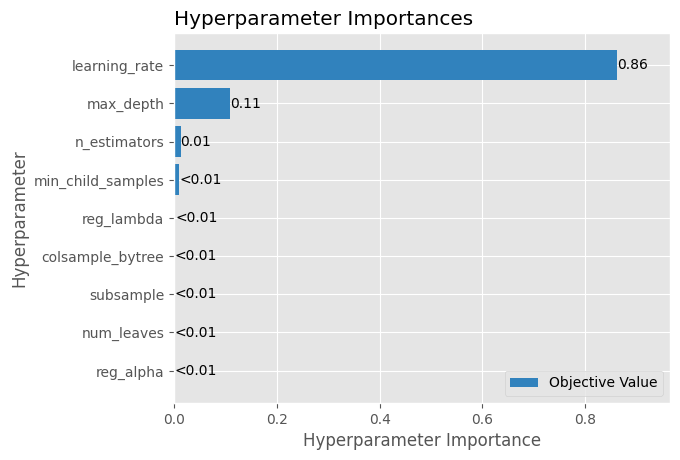

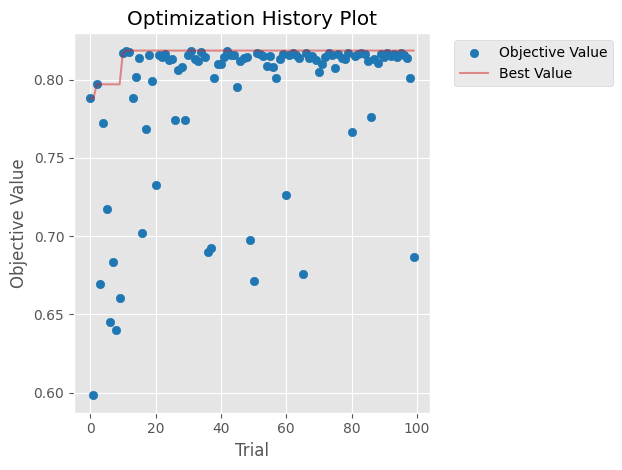

In [19]:
# Run the experiment for LightGBM
run_optuna_experiment()